## Image Preprocessor
---
---
Notebook is based upon the two part article found here: 
[part1](https://towardsdatascience.com/massive-tutorial-on-image-processing-and-preparation-for-deep-learning-in-python-1-e534ee42f122), 
[part2](https://towardsdatascience.com/massive-tutorial-on-image-processing-and-preparation-for-deep-learning-in-python-2-14816263b4a5)

### Requirements
---

In [26]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray, label2rgb
from skimage.filters import try_all_threshold, threshold_local, sobel, gaussian, threshold_otsu
from skimage.exposure import equalize_hist, equalize_adapthist
from skimage.transform import rotate, rescale, resize
from skimage.restoration import inpaint, denoise_tv_chambolle, denoise_bilateral
from skimage.util import random_noise
from skimage.segmentation import slic
from skimage.measure import find_contours
from skimage.feature import canny, corner_harris, corner_peaks

### Loading and Exploring Image Data
---

In [2]:
# helper method to visually compare two images
def show(org_img, altered_img, title1, title2, colour_map1, colour_map2 ):
    _, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 10))
    ax1.imshow(org_img, cmap = colour_map1)
    ax1.set_title(title1)
    ax2.imshow(altered_img, cmap = colour_map2)
    ax2.set_title(title2)
    for a in (ax1, ax2):
        a.axis('off')
    plt.tight_layout()
    plt.plot()

In [3]:
# opening the image as np.array
path = os.path.join("img", "landscape.jpg")
img = imread(path)
type(img)

numpy.ndarray

In [4]:
# NOTE: the number of colour channels (RGB in this case) can also be accessed via img.ndim
print("Image dimensions (height, width, #channels):", img.shape)
# 960 * 1280 * 3
print("Number of pixels:", img.size)

Image dimensions (height, width, #channels): (960, 1280, 3)
Number of pixels: 3686400


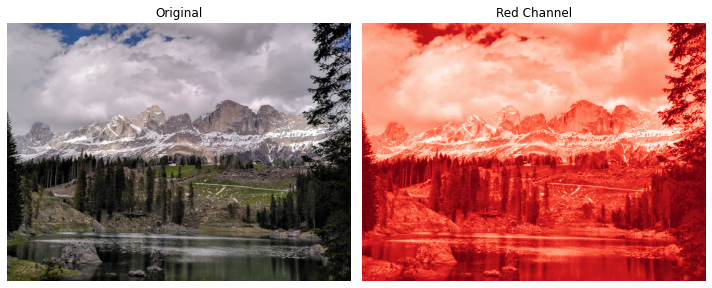

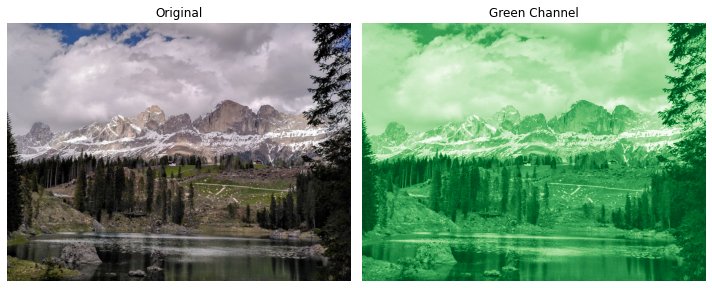

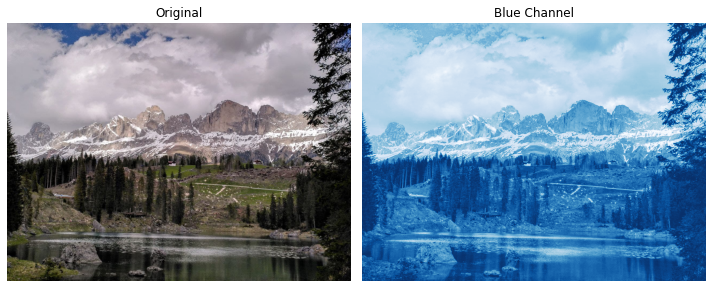

In [5]:
# displaying the individual channels, indexing is [height, width, channel]
red = img[:, :, 0]
green = img[:, :, 1]
blue = img[:, :, 2]
# list of available colour spaces: https://matplotlib.org/stable/tutorials/colors/colormaps.html (accessed 18.02.2022)
show(img, red, title1="Original", title2="Red Channel", colour_map1="viridis" ,colour_map2="Reds_r")
show(img, green, title1="Original", title2="Green Channel",  colour_map1="viridis", colour_map2="Greens_r")
show(img, blue, title1="Original", title2="Blue Channel",  colour_map1="viridis", colour_map2="Blues_r")

### Converting RGB-Image to grayscaled Image
---

(960, 1280)


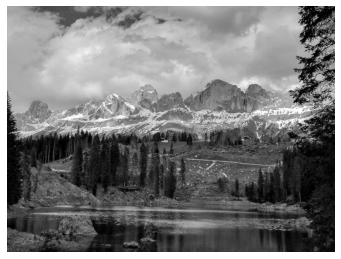

In [6]:
gray_scaled = rgb2gray(img)
# NOTE: default cmap is "viridis", to correctly display the converted image the following map should be used
plt.imshow(gray_scaled, cmap="gray")
plt.tight_layout()
plt.axis("off")
# NOTE: converting a RGB image to its gray-scaled version, dimensinality is reduced to 1 -> brightness values ranging from 0 to 255
print(gray_scaled.shape)

### Flipping images
---

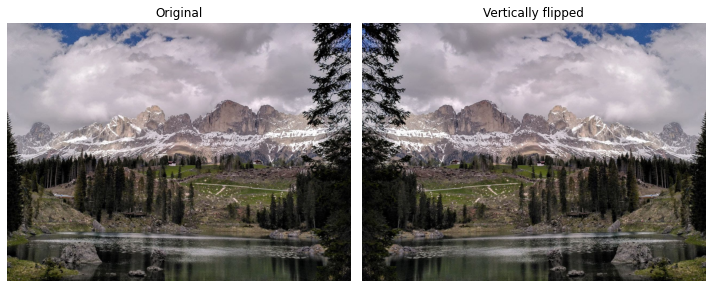

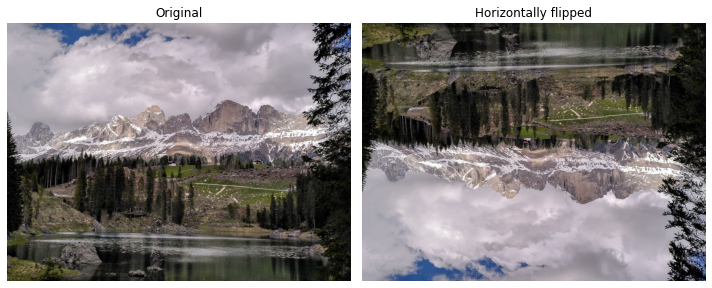

In [7]:
vertically_flipped = np.fliplr(img)
horizontally_flipped = np.flipud(img)
show(img, vertically_flipped, "Original", "Vertically flipped", "viridis", "viridis")
show(img, horizontally_flipped, "Original", "Horizontally flipped", "viridis", "viridis")

### Transformation
---

Text(0.5, 1.0, 'Resized')

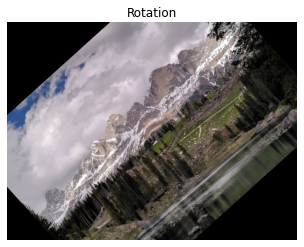

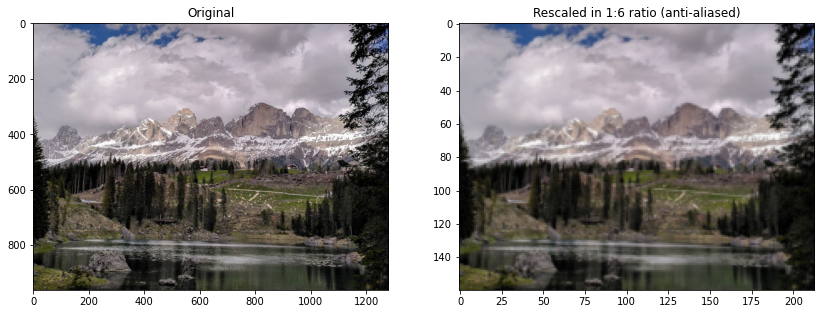

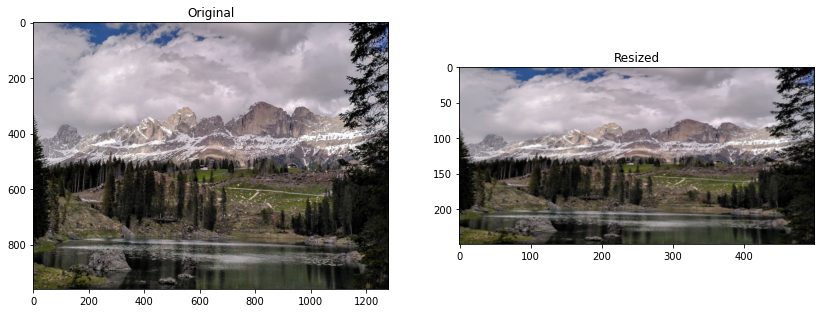

In [8]:
# angle-wise rotating
rotation = rotate(img, angle = 42)
plt.imshow(rotation)
plt.axis("off")
plt.title("Rotation")

# rescaling -> NOTE: to reduce quality loss during downscaling, anti_aliasing should be set to True 
rescaled = rescale(img, scale = 1/6, multichannel=True, anti_aliasing=True)
_, (ax1, ax2) = plt.subplots(1,2, figsize = (14, 14))
ax1.imshow(img)
ax1.set_title("Original")
ax2.imshow(rescaled)
ax2.set_title("Rescaled in 1:6 ratio (anti-aliased)")

# resizing
resized = resize(img, output_shape=(250,500))
_, (ax1, ax2) = plt.subplots(1,2, figsize = (14, 14))
ax1.imshow(img)
ax1.set_title("Original")
ax2.imshow(resized)
ax2.set_title("Resized")

### Get Histograms
---

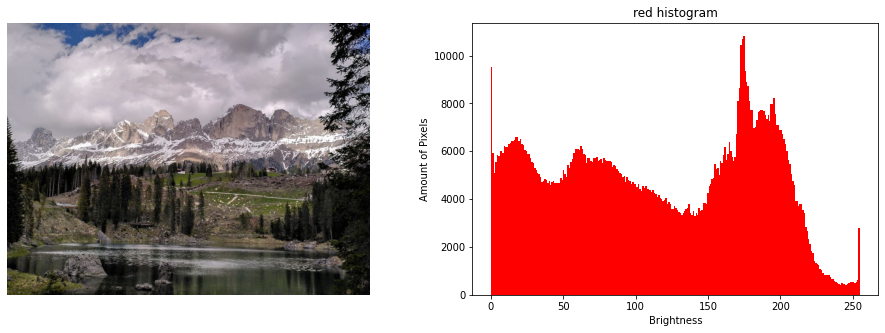

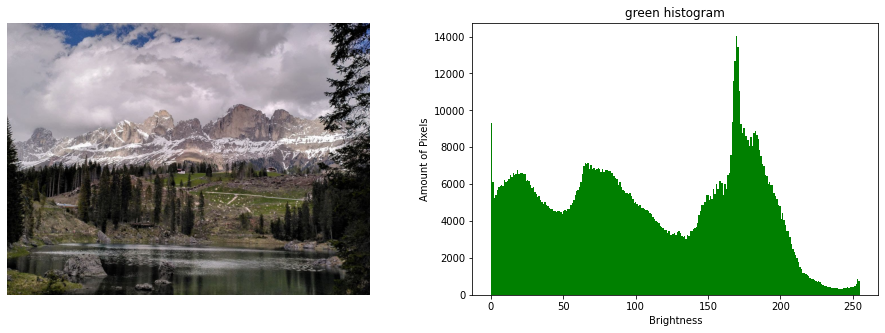

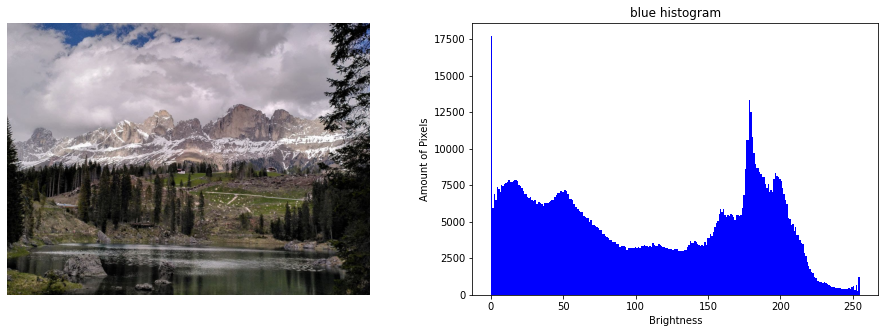

In [9]:
def plot_with_hist_channel(image, channel):
    colour_channels = {"red" : 0, "green" : 1, "blue" : 2}
    _, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 5))
    extracted_channel = image[:, :, colour_channels[channel]]
    ax1.imshow(image)
    ax1.axis("off")
    # use ravel to flatetn numpy arrays
    ax2.hist(extracted_channel.ravel(), bins = 256, color = channel) 
    ax2.set_title(f"{channel} histogram")
    ax2.set_xlabel("Brightness")
    ax2.set_ylabel("Amount of Pixels")

plot_with_hist_channel(img, "red")
plot_with_hist_channel(img, "green")   
plot_with_hist_channel(img, "blue")

Text(0, 0.5, 'Amount of Pixels')

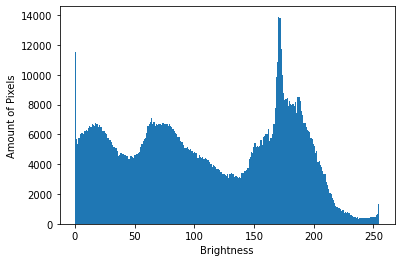

In [10]:
# using the same method to find out about light distribution
plt.hist(gray_scaled.ravel() * 255, bins=256)
plt.xlabel("Brightness")
plt.ylabel("Amount of Pixels")

### Filtering
---

Average brightness level: 0.431445981551266


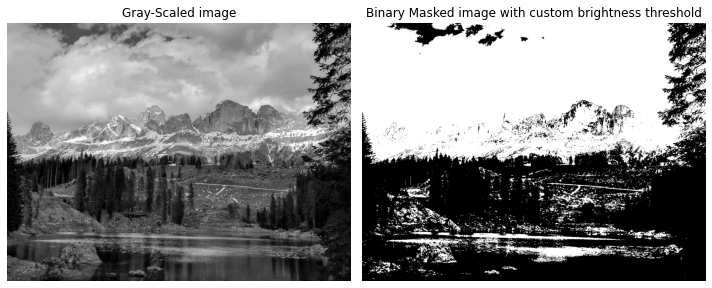

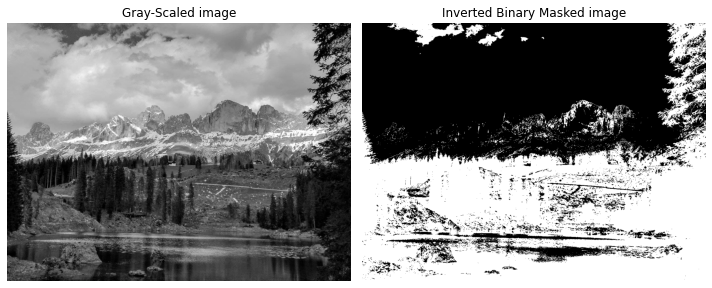

In [11]:
# retrieving the average brightness value of all pixel within the gray-scales version of the original image, NOTE: these values are normalized (between 0 and 1)
avg_brightness = gray_scaled.mean()
print("Average brightness level:", avg_brightness)
# define a threshold for binary mask
threshold = .4
# apply treshold to gray-scaled image via broadcasting
binary_masked_image = gray_scaled > threshold
show(
    gray_scaled, 
    binary_masked_image, 
    "Gray-Scaled image", 
    "Binary Masked image with custom brightness threshold", 
    "gray", "gray"
    )
# inverted mask
inverted_binary_masked_image = gray_scaled <= threshold
show(
    gray_scaled, 
    inverted_binary_masked_image, 
    "Gray-Scaled image", 
    "Inverted Binary Masked image", 
    "gray", "gray"
    )

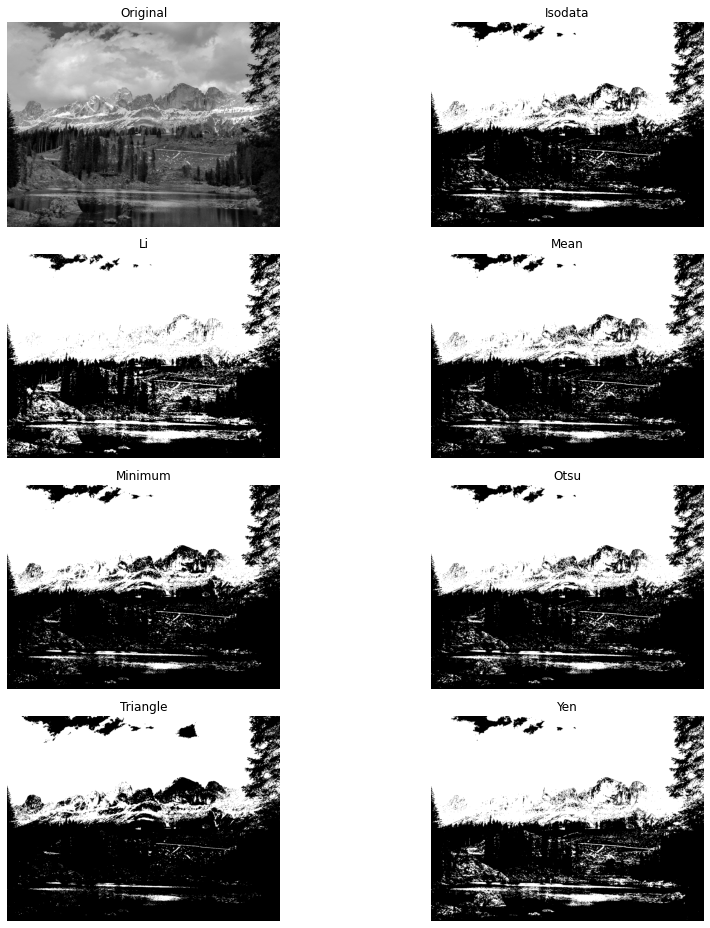

In [12]:
# run diffent algorithms for calculating a global threshold, depending on the features to identify, this can help choosing a threshold by providing an overview
# NOTE: if the brightness is distributed in an unbalanced way, it might be necessary to define a local threshold
# NOTE: the names displayed can be accessed as functions, e.g. from skimage.filters import threshold_otsu
fig, ax = try_all_threshold(gray_scaled, figsize=(14, 13), verbose=False)

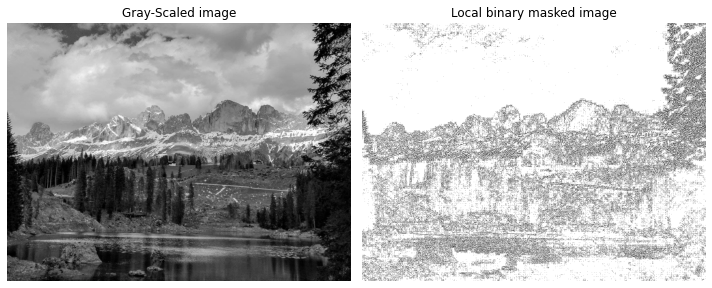

In [13]:
# offset = constant subtracted from the mean of the local pixel neighborhood (defined by block_size -> (odd!) number of pixels to take into consideration)
local_threshold = threshold_local(gray_scaled, block_size = 3, offset = 0.001)
local_binary_masked_image = gray_scaled > local_threshold
show(
    gray_scaled, 
    local_binary_masked_image, 
    "Gray-Scaled image", 
    "Local binary masked image", 
    "gray", 
    "gray"
    )

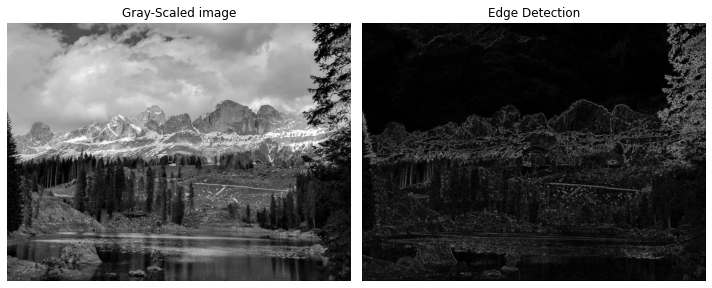

In [14]:
# Edge detection, consider using sobel_h or sobel_v to go for horizontal or vertical edges specifically
# due to small kernel size, results have a tendency towards getting noisy -> apply gaussian blur first
edges = sobel(gray_scaled)
show(
    gray_scaled, 
    edges, 
    "Gray-Scaled image", 
    "Edge Detection", 
    "gray", 
    "gray"
    )

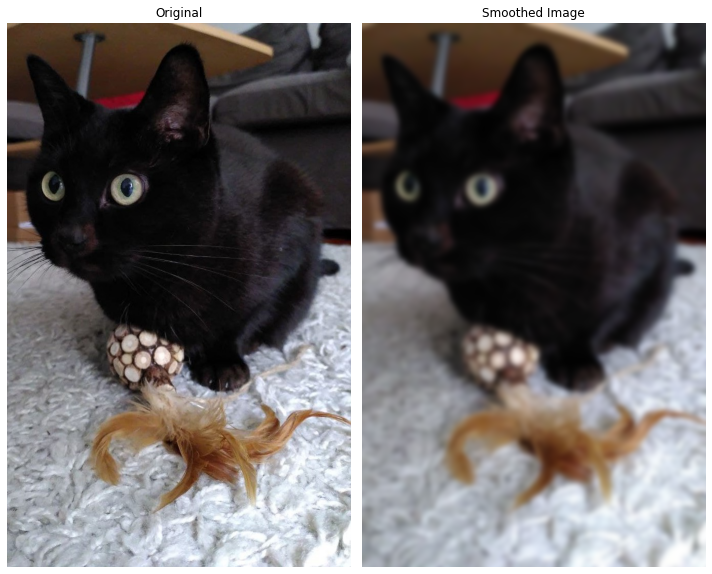

In [15]:
# apply gaussian smoothing to reduce noise within the image, this can help to improve complex ML models performances, 
# sigma = amount of smoothing
# Multichannel = True for RGB images
cat = imread(os.path.join("img", "cat.jpg"))
smoothed = gaussian(cat, multichannel = True, sigma = 5)
show(
    cat, 
    smoothed, 
    "Original", 
    "Smoothed Image", 
    "gray", 
    "gray"
    )

### Contrast enhancement
---
Can be achived by:<br>
1) *Contrast streching*<br><br>
2) *Histogram equalization* → spreading out high contrast areas to less brighter regions<br><br>
    2.1) *Standard histogram equalization* → perform *histogram eq.* gobally<br><br>
    2.2) *Adaptive histogram equalization* → perform *histogram eq.* on multiple none-overlapping *tiles* (can amplify noise)<br><br>
    2.3) *Contrast Limited Adaptive Histogram Equalization* (CLAHE) → limits contrast of the before described approach below a specified limit to avoid/decrease noise amplification; linear interpolation is applied on the tiles edges

**Contrast is calculated by subtracting the lowest pixel value from the highest**<br><br>
$contrast = img.max() - img.min()$

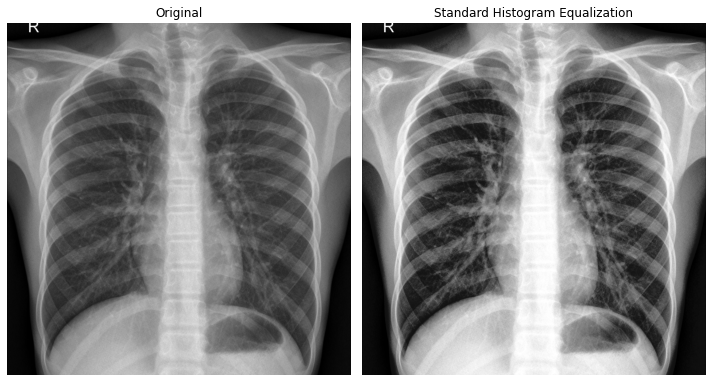

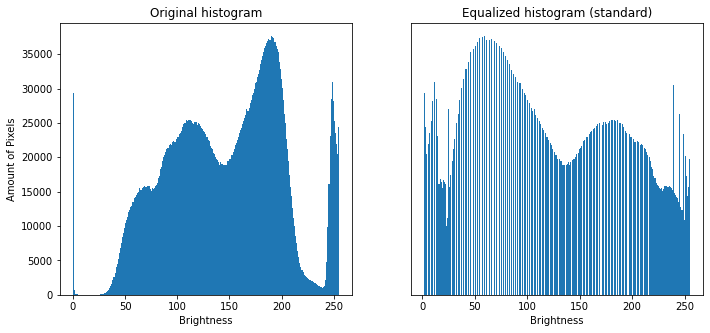

In [16]:
# img_src: https://data.mendeley.com/datasets/rscbjbr9sj/2 (accessed: 19.02.22)
xray = imread(os.path.join("img", "xray.jpg"))
# standard histogram equlization
xray_SHE = equalize_hist(xray)

show(
    xray, 
    xray_SHE, 
    "Original", 
    "Standard Histogram Equalization", 
    "gray", 
    "gray"
    ) 
# display histograms for comparison
_, (ax1, ax2) = plt.subplots(1, 2, figsize = (11.53, 5))
ax1.hist(xray.ravel() * 255, bins=256)    
ax2.hist(xray_SHE.ravel() * 255, bins=256)    

ax1.set_title("Original histogram")
ax1.set_ylabel("Amount of Pixels")
ax1.set_xlabel("Brightness")

ax2.set_title("Equalized histogram (standard)")
ax2.set_xlabel("Brightness")    
ax2.get_yaxis().set_visible(False)

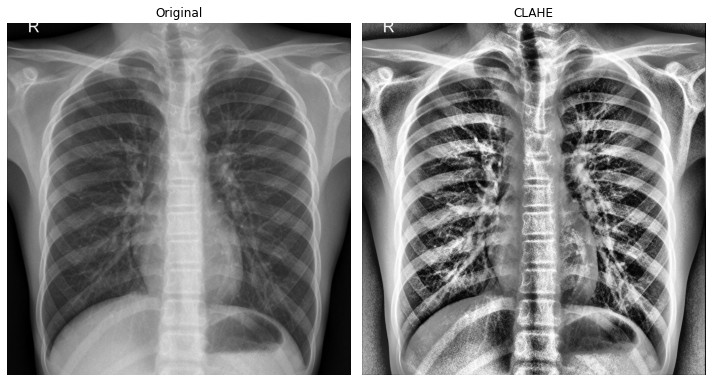

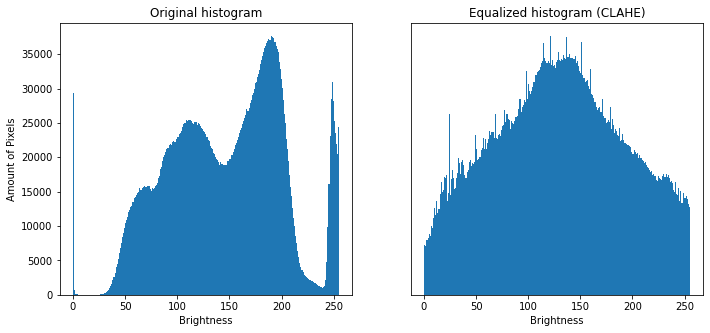

In [17]:
# contrast limited adaptive histogram equlization (CLAHE), "An algorithm for local contrast enhancement, that uses histograms computed over different tile regions of the image. 
# Local details can therefore be enhanced even in regions that are darker or lighter than most of the image." src: https://scikit-image.org/docs/stable/api/skimage.exposure.html (accessed: 19.02.22)
xray_CLAHE = equalize_adapthist(xray, clip_limit=0.4)

show(
    xray, 
    xray_CLAHE, 
    "Original", 
    "CLAHE", 
    "gray", 
    "gray"
    ) 
# display histograms for comparison
_, (ax1, ax2) = plt.subplots(1, 2, figsize = (11.53, 5))
ax1.hist(xray.ravel() * 255, bins=256)    
ax2.hist(xray_CLAHE.ravel() * 255, bins=256)    

ax1.set_title("Original histogram")
ax1.set_ylabel("Amount of Pixels")
ax1.set_xlabel("Brightness")

ax2.set_title("Equalized histogram (CLAHE)")
ax2.set_xlabel("Brightness")    
ax2.get_yaxis().set_visible(False)

### Restauration & Enhancements
---

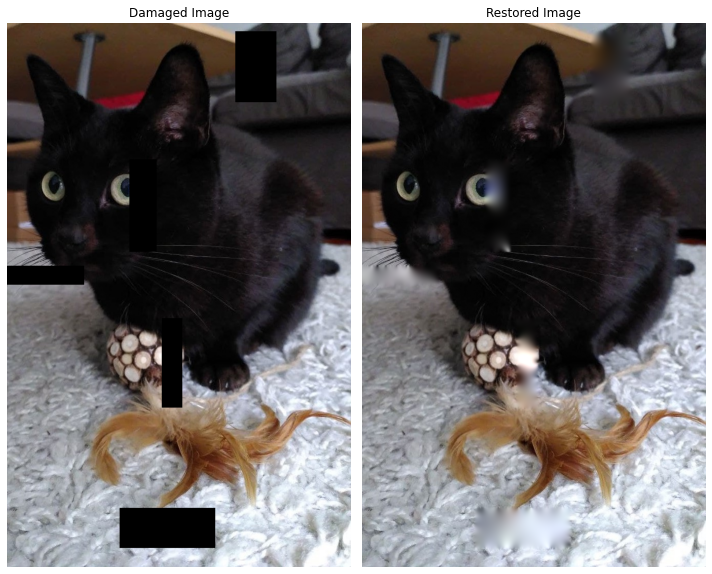

In [18]:
damaged_image = imread(os.path.join("img", "damaged_img.png"))
mask = damaged_image[:,:,0] == 0
# simulate lost information
restored_image = inpaint.inpaint_biharmonic(
    image=damaged_image, mask=mask, multichannel=True
)
show(
    damaged_image, 
    restored_image, 
    "Damaged Image", 
    "Restored Image", 
    "gray", 
    "gray"
    ) 

### Noise 
---

(-0.5, 499.5, 499.5, -0.5)

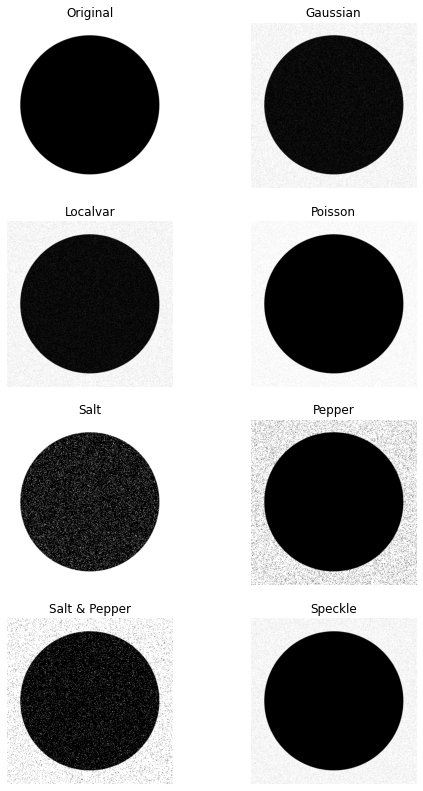

In [19]:
# adding noise
circle = rgb2gray(
    imread(
        os.path.join("img", "circle.png")
    )
)
# apply different kinds of noise
gauss = random_noise(circle)
localvar = random_noise(circle, mode="localvar")
poisson = random_noise(circle, mode="poisson")
salt = random_noise(circle, mode="salt" ,amount = 0.1)
pepper = random_noise(circle, mode="pepper" ,amount = 0.1)
s_and_p = random_noise(circle, mode="s&p" ,amount = 0.1)
speckle = random_noise(circle, mode="speckle")

# tedious display related code
_, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(8,14))
ax1.set_title("Original")
ax1.imshow(circle, cmap="gray")
ax1.axis("off")
ax2.set_title("Gaussian")
ax2.imshow(gauss, cmap="gray")
ax2.axis("off")
ax3.set_title("Localvar")
ax3.imshow(localvar, cmap="gray")
ax3.axis("off")
ax4.set_title("Poisson")
ax4.imshow(poisson, cmap="gray")
ax4.axis("off")
ax5.set_title("Salt")
ax5.imshow(salt, cmap="gray")
ax5.axis("off")
ax6.set_title("Pepper")
ax6.imshow(pepper, cmap="gray")
ax6.axis("off")
ax7.set_title("Salt & Pepper")
ax7.imshow(s_and_p, cmap="gray")
ax7.axis("off")
ax8.set_title("Speckle")
ax8.imshow(speckle, cmap="gray")
ax8.axis("off")

(-0.5, 499.5, 499.5, -0.5)

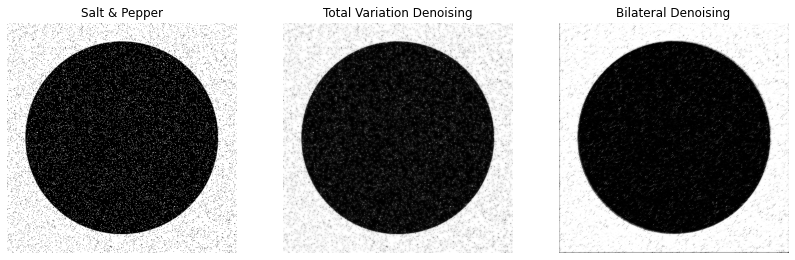

In [20]:
# Reducing noise
tv_denoise = denoise_tv_chambolle(s_and_p, weight = 0.2, multichannel=False)
bilateral = denoise_bilateral(s_and_p, multichannel=False)

_, (ax1, ax2, ax3) = plt.subplots(1,3, figsize= (14,14))
ax1.imshow(s_and_p, cmap="gray")
ax1.set_title("Salt & Pepper")
ax1.axis("off")
ax2.imshow(tv_denoise, cmap="gray")
ax2.set_title("Total Variation Denoising")
ax2.axis("off")
ax3.imshow(bilateral, cmap="gray")
ax3.set_title("Bilateral Denoising")
ax3.axis("off")

### Superpixels & Segmentation
---
- "[...] multiple groups of pixels that are similar in contrast, color, or brightness [...] are called superpixels."<br>[src](https://towardsdatascience.com/massive-tutorial-on-image-processing-and-preparation-for-deep-learning-in-python-2-14816263b4a5) (accessed: 20.02.22)
    - An algorithm using **k-Means clustering** for doing so is called *Simple Linear Iterative Cluster* (SLIC)

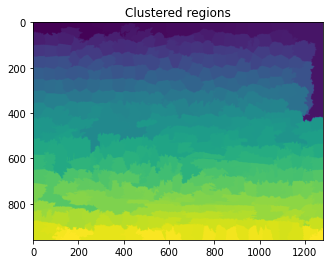

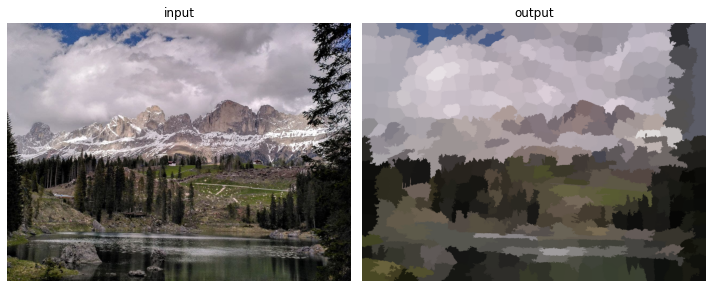

In [21]:
# image segmentation, returns an integer mask
labels = slic(img, n_segments=500)
# apply labels to orignal image
labels_to_rgb = label2rgb(labels, img, kind = "avg")

plt.imshow(labels)
plt.title("Clustered regions")

show(
    img, 
    labels_to_rgb,
    "input", "output", 
    "viridis", "viridis"
)

### Contours
---

(-0.5, 511.5, 511.5, -0.5)

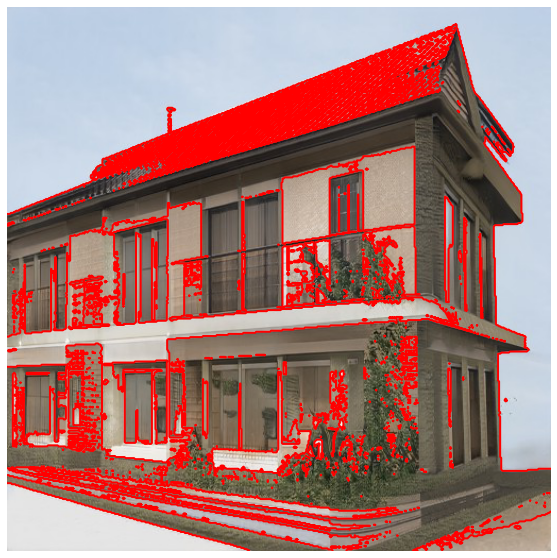

In [34]:
# open image, consider denoising for improved results
house = imread(os.path.join("img", "house.jpg"))
# converting image to gray-scale
house_gray_scaled = rgb2gray(house)
# find a suitable threshold 
thresh = threshold_otsu(house_gray_scaled) 
# create binary image
house_gray_binary = house_gray_scaled > thresh
# get coordinates of contour lines as list, 2. param = value along which to find conours in the array 
# see: https://scikit-image.org/docs/stable/api/skimage.measure.html?highlight=skimage%20measure%20find_contours#skimage.measure.find_contours (acessed: 20.02.2022)
house_contours = find_contours(house_gray_binary, .8)
# plot contours
_, ax = plt.subplots(figsize=(10,10))
ax.imshow(house)
for contour in house_contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="red")
ax.axis("off")

### Edge Detection
---

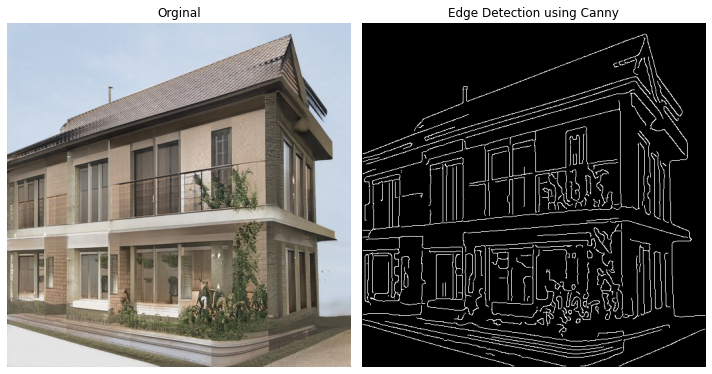

In [35]:
# canny takes sobel as input 
# gray_scaled -> gaussian blur (tune amount using sigma) -> horizontal_sobel and vertical_sobel -> 
# retrieve gradient and orientation of both aforementioned filters -> CANNY:
# 1) Decide whether pixel is a local maximum, while accounting for the direction of the sobel filter
# Hysteresis (2 stages Threshold), decide what edge is important
edges = canny(house_gray_scaled, sigma = 2)
show(
    house,
    edges,
    "Orginal",
    "Edge Detection using Canny",
    "viridis",
    "gray"
)

### Corner Detection
---

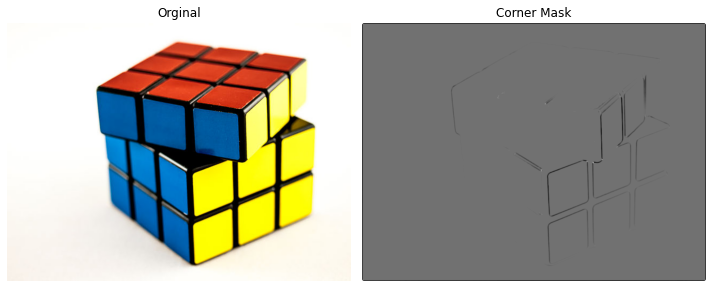

In [57]:
# image src: https://upload.wikimedia.org/wikipedia/commons/thumb/9/9d/Rubiks_Cube_%2811913436786%29.jpg/640px-Rubiks_Cube_%2811913436786%29.jpg (accessed: 21.02.22)
cube = imread(os.path.join("img", "cube.jpg"))
# based on gradient distrbution, corner_harris results in a mask of where corners are located, which can be passed to corner_peaks()
# corner can be defined, distinguishing it from edges, as a rapid change of image intensity in two directions
measured_image = corner_harris(rgb2gray(cube), k = .075, sigma = .75)
show(
    cube,
    measured_image,
    "Orginal",
    "Corner Mask",
    "viridis",
    "gray"
)

(-0.5, 639.5, 479.5, -0.5)

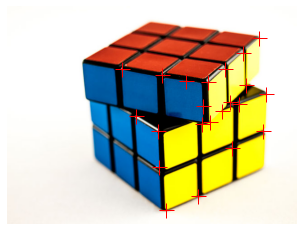

In [58]:
# min_distance is the amount of pixels between corners 
corner_coordinates = corner_peaks(measured_image, min_distance = 15, threshold_rel = .01)
plt.imshow(cube, cmap = "gray")
plt.plot(corner_coordinates[:, 1], corner_coordinates[:, 0], "+r", markersize = 15)
plt.axis("off")